In [1]:
import pandas as pd
import os
import numpy as np
file_path = os.path.join(os.path.expanduser("~"), "Downloads", "contests recap 2.csv")
df = pd.read_csv(file_path)
print(df.head())

                           entry_id             title activation_id  \
0  768e8528a7bdb847b20b37d9f8c35d66  Flock to Buffalo  XnQjWAcqzlPO   
1  49d62618026e420331eedcb23cbecdc1  Flock to Buffalo  XnQjWAcqzlPO   
2  0a6b709593f46861e56fa4f05be5c436  Flock to Buffalo  XnQjWAcqzlPO   
3  7b70c9845f0f0d10a37ef4509519c8dd  Flock to Buffalo  XnQjWAcqzlPO   
4  f8c35b3b91aab5d27c1ed0eae114e18a  Flock to Buffalo  XnQjWAcqzlPO   

             starttime_iso              endtime_iso         type  \
0  2025-01-13 04:30:00.000  2025-01-15 04:59:00.000  sweepstakes   
1  2025-01-13 04:30:00.000  2025-01-15 04:59:00.000  sweepstakes   
2  2025-01-13 04:30:00.000  2025-01-15 04:59:00.000  sweepstakes   
3  2025-01-13 04:30:00.000  2025-01-15 04:59:00.000  sweepstakes   
4  2025-01-13 04:30:00.000  2025-01-15 04:59:00.000  sweepstakes   

                       email firstname     lastname     zip  ... helix_source  \
0      mike0420one@gmail.com   Michael   McWilliams  21622   ...   dotdigital   
1 

In [3]:
df['title'] = df['title'].astype(str)

In [5]:
print(df.dtypes)

entry_id                  object
title                     object
activation_id             object
starttime_iso             object
endtime_iso               object
type                      object
email                     object
firstname                 object
lastname                  object
zip                       object
county                    object
state                     object
hma_ind                  float64
enteredat_iso             object
emailoptin                  bool
sms_opt_in               float64
sponsor_opt_in           float64
psl_owner                  int64
sgb_attendee               int64
retail_spend             float64
num_retail_orders        float64
helix_source              object
gender_prsn               object
age_rng_prsn             float64
adv_hh_marital_status    float64
adv_target_income_2       object
target_net_worth_2       float64
occupation               float64
adv_hh_education         float64
niches_3                  object
hh_type_fa

##Checking Work

In [7]:
unique_titles_count = df['title'].nunique()
print(f"Unique number of title names: {unique_titles_count}")

Unique number of title names: 49


##Unique entrants per contest

In [9]:
df['email'] = df['email'].str.lower()
entrants_per_contest = df.groupby('title')['email'].nunique().sort_values()
pd.set_option('display.max_rows', None)
print(entrants_per_contest)

title
Roquan Smith Walter Payton Man of the Year Jersey Sweepstakes, presented by Nationwide      10
GEHA Letters to the Ravens                                                                  12
Purple Rising Community Athlete Award                                                       21
Ravens vs Steelers Trivia                                                                   23
Fiesta Baltimore Sweepstakes                                                                51
SeatGeek Photo Op Sweepstakes                                                               67
Ravens Pride Parade Sweepstakes                                                             77
Hispanic & Latino Heritage Clinic                                                           95
2024 Maryland Girls Flag Championship Sweepstakes                                           99
Ticket Interest Form                                                                       104
Constellation Sacks For Science             

In [57]:
# Convert Series to DataFrame to save it as a CSV
entrants_per_contest_df = entrants_per_contest.reset_index()
entrants_per_contest_df.columns = ['title', 'unique_email_count']

# Export to CSV
entrants_per_contest_df.to_csv('entrants_per_contest_with_index.csv')

In [61]:
directory = '/Users/TimmD/Downloads'
file_path = os.path.join(directory, 'entrants_per_contest2.csv')
if not os.path.exists(directory):
    os.makedirs(directory)
entrants_per_contest_df.to_csv(file_path, index=False)
print(f"CSV file saved at {file_path}")

CSV file saved at /Users/TimmD/Downloads\entrants_per_contest2.csv


##Calculations

In [11]:
unique_entrants_per_contest = df.groupby('title')['email'].nunique()
average_entrants_per_contest = unique_entrants_per_contest.mean()
print(f"Average number of entrants per contest: {average_entrants_per_contest}")

Average number of entrants per contest: 2053.0204081632655


In [33]:
# Calculate total unique emails in the entire dataset
total_unique_emails = df['email'].str.lower().nunique()

print(f"Total unique emails in the entire dataset: {total_unique_emails}")

Total unique emails in the entire dataset: 69318


In [15]:
entries_per_email = df.groupby('email').size()
average_entries_per_email = entries_per_email.mean()
print(f"Average number of entries per email: {average_entries_per_email:.2f}")

Average number of entries per email: 4.28


In [17]:
entries_per_email = df.groupby('email').size()
emails_entered_more_than_one = entries_per_email[entries_per_email > 1]
num_emails_entered_more_than_one = len(emails_entered_more_than_one)
print(f"Number of unique emails that entered more than one contest: {num_emails_entered_more_than_one}")

Number of unique emails that entered more than one contest: 17561


In [19]:
percentage_emails_entered_more_than_one = (num_emails_entered_more_than_one / total_unique_emails) * 100
print(f"Percentage of unique emails that entered more than one contest: {percentage_emails_entered_more_than_one:.2f}%")

Percentage of unique emails that entered more than one contest: 25.33%


##Columns S-AA finding demographics

In [25]:
df_unique = df.groupby('email', as_index=False).agg({'gender_prsn': 'first'})
df_unique['gender_prsn'] = df_unique['gender_prsn'].replace({1: 'men', 2: 'women'})
gender_counts = df_unique['gender_prsn'].value_counts()
total_men_and_women = gender_counts.sum()
men_percentage = (gender_counts['men'] / total_men_and_women) * 100
women_percentage = (gender_counts['women'] / total_men_and_women) * 100
print("Counts:")
print(gender_counts)
print("\nPercentages:")
print(f"Men: {men_percentage:.2f}%")
print(f"Women: {women_percentage:.2f}%")

Counts:
gender_prsn
men      11777
women    11175
Name: count, dtype: int64

Percentages:
Men: 51.31%
Women: 48.69%


In [133]:
df_unique1 = df.groupby('email', as_index=False).agg({'age_rng_prsn': 'first'})
age_counts = df_unique1['age_rng_prsn'].value_counts().sort_index()
total_age_counts = age_counts.sum()
age_percentages = (age_counts / total_age_counts) * 100
print("Counts:")
print(age_counts)
print("\nPercentages:")
print(age_percentages)

Counts:
age_rng_prsn
18.0      30
20.0      97
22.0     296
24.0     478
26.0     763
28.0     833
30.0     853
32.0    1015
34.0    1118
36.0    1050
38.0    1083
40.0    1039
42.0     981
44.0     956
46.0     927
48.0     872
50.0     747
52.0     834
54.0     861
56.0     803
58.0     829
60.0     818
62.0     771
64.0     628
66.0     621
68.0     451
70.0     356
72.0     261
74.0     185
76.0     154
78.0      82
80.0      62
82.0      49
84.0      22
86.0      25
88.0      14
90.0       4
92.0       4
94.0       2
Name: count, dtype: int64

Percentages:
age_rng_prsn
18.0    0.143034
20.0    0.462477
22.0    1.411271
24.0    2.279012
26.0    3.637837
28.0    3.971584
30.0    4.066940
32.0    4.839325
34.0    5.330409
36.0    5.006198
38.0    5.163536
40.0    4.953752
42.0    4.677219
44.0    4.558024
46.0    4.419758
48.0    4.157528
50.0    3.561552
52.0    3.976352
54.0    4.105082
56.0    3.828550
58.0    3.952513
60.0    3.900067
62.0    3.675980
64.0    2.994183
66.0    2.9

Counts:
age_group
18-25     871
26-35    4582
36-45    5109
46-55    4241
56-65    3849
66+      2292
Name: count, dtype: int64

Percentages:
age_group
18-25     4.158709
26-35    21.877387
36-45    24.393621
46-55    20.249236
56-65    18.377578
66+      10.943468
Name: count, dtype: float64


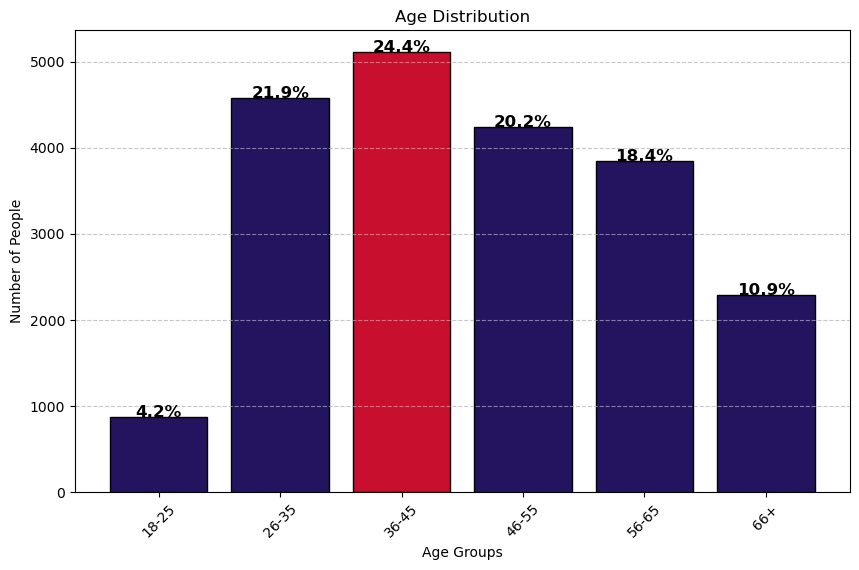

In [139]:
# Ensure df_unique1 is defined
df_unique1 = df.groupby('email', as_index=False).agg({'age_rng_prsn': 'first'})

# Define age bins and labels
bins = [18, 25, 35, 45, 55, 65, float('inf')]  # Upper bound for 66+
labels = ['18-25', '26-35', '36-45', '46-55', '56-65', '66+']

# Categorize ages into bins
df_unique1['age_group'] = pd.cut(df_unique1['age_rng_prsn'], bins=bins, labels=labels, right=True)

# Count occurrences
age_counts = df_unique1['age_group'].value_counts().sort_index()
total_age_counts = age_counts.sum()
age_percentages = (age_counts / total_age_counts) * 100

# Print Counts & Percentages
print("Counts:")
print(age_counts)
print("\nPercentages:")
print(age_percentages)

# Identify the max value to color it differently
max_value = age_counts.max()

# Assign colors: max bar = red, others = navy
bar_colors = ['#c8102E' if count == max_value else '#24135F' for count in age_counts]

# Plot Histogram
plt.figure(figsize=(10, 6))
bars = plt.bar(age_counts.index, age_counts.values, color=bar_colors, edgecolor='black')

# Add percentage labels on top of each bar
for bar, percent in zip(bars, age_percentages):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1, f"{percent:.1f}%", 
             ha='center', fontsize=12, fontweight='bold', color='black')

# Labels and Formatting
plt.xlabel("Age Groups")
plt.ylabel("Number of People")
plt.title("Age Distribution")
plt.xticks(rotation=45)
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Show Plot
plt.show()

In [36]:
age_summary_df = pd.DataFrame({
    'age_rng_prsn': age_counts.index,
    'count': age_counts.values,
    'percentage': age_percentages.values
})

# Specify the directory and file path
directory = '/my/path'
file_path = os.path.join(directory, 'age_summary.csv')

# Create the directory if it doesn't exist
if not os.path.exists(directory):
    os.makedirs(directory)

# Save the DataFrame to a CSV file
age_summary_df.to_csv(file_path, index=False)
print(f"CSV file saved at {file_path}")

CSV file saved at /my/path\age_summary.csv


In [29]:
df_unique2 = df.groupby('email', as_index=False).agg({'adv_hh_marital_status': 'first'})
marital_status_counts = df_unique2['adv_hh_marital_status'].value_counts()
total_marital_status = marital_status_counts.sum()
marital_status_percentages = (marital_status_counts / total_marital_status) * 100
print("Counts:")
print(marital_status_counts)
print("\nPercentages:")
for status, percentage in marital_status_percentages.items():
    print(f"{status}: {percentage:.2f}%")

Counts:
adv_hh_marital_status
1.0    20023
2.0    13860
3.0      673
Name: count, dtype: int64

Percentages:
1.0: 57.94%
2.0: 40.11%
3.0: 1.95%


In [40]:
marital_status_summary_df = pd.DataFrame({
    'marital_status': marital_status_counts.index,
    'count': marital_status_counts.values,
    'percentage': marital_status_percentages.values
})
directory = '/my/path'
file_path = os.path.join(directory, 'marital_status_summary.csv')
if not os.path.exists(directory):
    os.makedirs(directory)
marital_status_summary_df.to_csv(file_path, index=False)
print(f"CSV file saved at {file_path}")

CSV file saved at /my/path\marital_status_summary.csv


In [31]:
df_unique3 = df.groupby('email', as_index=False).agg({'adv_target_income_2': 'first'})
income_counts = df_unique3['adv_target_income_2'].value_counts().sort_index()
total_income_targets = income_counts.sum()
income_percentages = (income_counts / total_income_targets) * 100
income_summary_df = pd.DataFrame({
    'income_target': income_counts.index,
    'count': income_counts.values,
    'percentage': income_percentages.values
})

directory = '/my/file/path'
file_path = os.path.join(directory, 'income_target_summary.csv')
if not os.path.exists(directory):
    os.makedirs(directory)

income_summary_df.to_csv(file_path, index=False)
print(f"CSV file saved at {file_path}")

print("\nCounts:")
print(income_counts)
print("\nPercentages:")
for target, percentage in income_percentages.items():
    print(f"{target}: {percentage:.2f}%")


CSV file saved at /my/file/path\income_target_summary.csv

Counts:
adv_target_income_2
1     509
2     534
3    3120
4    2631
5    2743
6    5490
7    5698
8    2554
9    4667
A    1100
B    1855
C    2390
D    1265
Name: count, dtype: int64

Percentages:
1: 1.47%
2: 1.55%
3: 9.03%
4: 7.61%
5: 7.94%
6: 15.89%
7: 16.49%
8: 7.39%
9: 13.51%
A: 3.18%
B: 5.37%
C: 6.92%
D: 3.66%


CSV file saved at /my/file/path\income_target_summary.csv


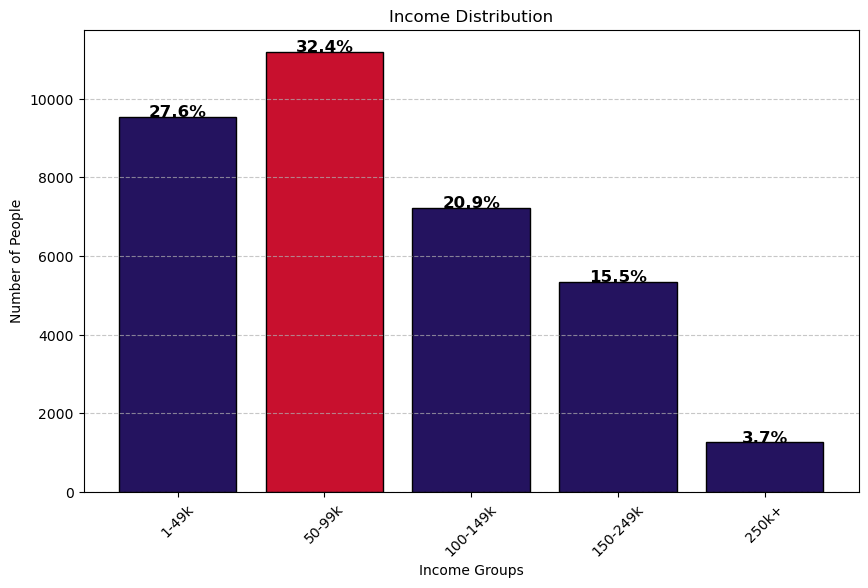


Counts:
income_group
1-49k        9537
50-99k      11188
100-149k     7221
150-249k     5345
250k+        1265
Name: count, dtype: int64

Percentages:
1-49k: 27.60%
50-99k: 32.38%
100-149k: 20.90%
150-249k: 15.47%
250k+: 3.66%


In [143]:
# Ensure df_unique3 is defined
df_unique3 = df.groupby('email', as_index=False).agg({'adv_target_income_2': 'first'})

# Define income bins and labels
income_mapping = {
    '1': '1-49k', '2': '1-49k', '3': '1-49k', '4': '1-49k', '5': '1-49k',
    '6': '50-99k', '7': '50-99k',
    '8': '100-149k', '9': '100-149k',
    'A': '150-249k', 'B': '150-249k', 'C': '150-249k',
    'D': '250k+'
}

# Map income values to categories
df_unique3['income_group'] = df_unique3['adv_target_income_2'].astype(str).map(income_mapping)

# Define correct order for income groups
income_order = ['1-49k', '50-99k', '100-149k', '150-249k', '250k+']

# Count occurrences and reindex to maintain correct order
income_counts = df_unique3['income_group'].value_counts().reindex(income_order, fill_value=0)
total_income_targets = income_counts.sum()
income_percentages = (income_counts / total_income_targets) * 100

# Save summary as CSV
income_summary_df = pd.DataFrame({
    'income_group': income_counts.index,
    'count': income_counts.values,
    'percentage': income_percentages.values
})

directory = '/my/file/path'
file_path = os.path.join(directory, 'income_target_summary.csv')
if not os.path.exists(directory):
    os.makedirs(directory)

income_summary_df.to_csv(file_path, index=False)
print(f"CSV file saved at {file_path}")

# Identify the max value to color it differently
max_value = income_counts.max()

# Assign colors: max bar = red, others = navy
bar_colors = ['#c8102E' if count == max_value else '#24135F' for count in income_counts]

# Plot Histogram
plt.figure(figsize=(10, 6))
bars = plt.bar(income_counts.index, income_counts.values, color=bar_colors, edgecolor='black')

# Add percentage labels on top of each bar
for bar, percent in zip(bars, income_percentages):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1, f"{percent:.1f}%", 
             ha='center', fontsize=12, fontweight='bold', color='black')

# Labels and Formatting
plt.xlabel("Income Groups")
plt.ylabel("Number of People")
plt.title("Income Distribution")
plt.xticks(rotation=45)
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Show Plot
plt.show()

# Print Counts & Percentages
print("\nCounts:")
print(income_counts)
print("\nPercentages:")
for group, percentage in income_percentages.items():
    print(f"{group}: {percentage:.2f}%")

In [35]:
df_unique4 = df.groupby('email', as_index=False).agg({'target_net_worth_2': 'first'})
net_worth_counts = df_unique4['target_net_worth_2'].value_counts()
total_net_worth_targets = net_worth_counts.sum()
net_worth_percentages = (net_worth_counts / total_net_worth_targets) * 100
net_worth_summary_df = pd.DataFrame({
    'net_worth_target': net_worth_counts.index,
    'count': net_worth_counts.values,
    'percentage': net_worth_percentages.values
})

net_worth_summary_df = net_worth_summary_df.sort_values(by='net_worth_target')

directory = '/my/file/path'
file_path = os.path.join(directory, 'net_worth_target_summary.csv')

if not os.path.exists(directory):
    os.makedirs(directory)

net_worth_summary_df.to_csv(file_path, index=False)
print(f"CSV file saved at {file_path}")

print("\nSorted Net Worth Target Summary:")
print(net_worth_summary_df)

CSV file saved at /my/file/path\net_worth_target_summary.csv

Sorted Net Worth Target Summary:
   net_worth_target  count  percentage
3               0.0   4548   13.555887
7               1.0   1451    4.324888
9               2.0   1168    3.481371
8               3.0   1216    3.624441
6               4.0   2028    6.044709
5               5.0   3471   10.345753
0               6.0   5819   17.344262
2               7.0   4979   14.840537
4               8.0   3655   10.894188
1               9.0   5215   15.543964


In [46]:
df_unique5 = df.groupby('email', as_index=False).agg({'occupation': 'first'})
occupation_counts = df_unique5['occupation'].value_counts()
total_occupations = occupation_counts.sum()
occupation_percentages = (occupation_counts / total_occupations) * 100

occupation_summary_df = pd.DataFrame({
    'occupation': occupation_counts.index,
    'count': occupation_counts.values,
    'percentage': occupation_percentages.values
})

occupation_summary_df = occupation_summary_df.sort_values(by='occupation')

directory = '/my/file/path'
file_path = os.path.join(directory, 'occupation_summary.csv')

if not os.path.exists(directory):
    os.makedirs(directory)

occupation_summary_df.to_csv(file_path, index=False)
print(f"CSV file saved at {file_path}")

print("\nSorted Occupation Summary:")
print(occupation_summary_df)

CSV file saved at /my/file/path\occupation_summary.csv

Sorted Occupation Summary:
    occupation  count  percentage
0          0.0  30999   71.363783
13         2.0     67    0.154243
2          5.0   3547    8.165661
3          6.0   1578    3.632764
12         7.0     75    0.172660
5          8.0    664    1.528615
4          9.0    671    1.544730
7         10.0    555    1.277683
9         12.0    212    0.488052
8         13.0    469    1.079700
6         14.0    640    1.473364
15        15.0     12    0.027626
14        17.0     34    0.078272
10        18.0    204    0.469635
11        19.0    109    0.250932
1         20.0   3602    8.292279


In [33]:
df_unique6 = df.groupby('email', as_index=False).agg({'adv_hh_education': 'first'})

education_counts = df_unique6['adv_hh_education'].value_counts()

total_educations = education_counts.sum()
education_percentages = (education_counts / total_educations) * 100

education_summary_df = pd.DataFrame({
    'education_level': education_counts.index,
    'count': education_counts.values,
    'percentage': education_percentages.values
})

education_summary_df = education_summary_df.sort_values(by='education_level')

directory = '/my/file/path'
file_path = os.path.join(directory, 'education_summary.csv')

if not os.path.exists(directory):
    os.makedirs(directory)

education_summary_df.to_csv(file_path, index=False)
print(f"CSV file saved at {file_path}")

print("\nSorted Education Summary:")
print(education_summary_df)

CSV file saved at /my/file/path\education_summary.csv

Sorted Education Summary:
   education_level  count  percentage
5              0.0     18    0.052089
4              1.0    395    1.143072
2              2.0   7396   21.402940
1              3.0  11083   32.072578
0              4.0  13793   39.914921
3              5.0   1871    5.414400


In [50]:
df_unique7 = df.groupby('email', as_index=False).agg({'niches_3': 'first'})

niches_counts = df_unique7['niches_3'].value_counts()

total_niches = niches_counts.sum()
niches_percentages = (niches_counts / total_niches) * 100

niches_summary_df = pd.DataFrame({
    'niche_category': niches_counts.index,
    'count': niches_counts.values,
    'percentage': niches_percentages.values
})

niches_summary_df = niches_summary_df.sort_values(by='niche_category')

directory = '/my/path'
file_path = os.path.join(directory, 'niches_summary.csv')

if not os.path.exists(directory):
    os.makedirs(directory)

niches_summary_df.to_csv(file_path, index=False)
print(f"CSV file saved at {file_path}")

print("\nSorted Niches Summary:")
print(niches_summary_df)

CSV file saved at /my/path\niches_summary.csv

Sorted Niches Summary:
    niche_category  count  percentage
80              A1     53    0.122013
30              A2    372    0.856393
77              A3     60    0.138128
100             A4     19    0.043741
98              A5     20    0.046043
50              A6    187    0.430499
81              A7     48    0.110502
106             A8      9    0.020719
0               B1   3771    8.681339
44              C1    228    0.524886
8               C2   1104    2.541553
1               C3   3663    8.432709
51              C4    185    0.425894
2               D1   3649    8.400479
21              E1    516    1.187900
101             E2     19    0.043741
3               E3   2317    5.334039
63              E4    141    0.324601
71              E5     77    0.177264
87              E6     35    0.080575
90              E7     31    0.071366
99              E8     20    0.046043
107             E9      2    0.004604
72              F1

In [52]:
df_unique8 = df.groupby('email', as_index=False).agg({'hh_type_family_comp': 'first'})

family_comp_counts = df_unique8['hh_type_family_comp'].value_counts()

total_family_comp = family_comp_counts.sum()
family_comp_percentages = (family_comp_counts / total_family_comp) * 100

family_comp_summary_df = pd.DataFrame({
    'family_composition': family_comp_counts.index,
    'count': family_comp_counts.values,
    'percentage': family_comp_percentages.values
})

family_comp_summary_df = family_comp_summary_df.sort_values(by='family_composition')

directory = '/my/file/path'
file_path = os.path.join(directory, 'family_comp_summary.csv')

if not os.path.exists(directory):
    os.makedirs(directory)

family_comp_summary_df.to_csv(file_path, index=False)
print(f"CSV file saved at {file_path}")

print("\nSorted Family Composition Summary:")
print(family_comp_summary_df)

CSV file saved at /my/file/path\family_comp_summary.csv

Sorted Family Composition Summary:
    family_composition  count  percentage
3                  1.0   6838   16.186531
1                  2.0   9287   21.983667
11                 3.0    163    0.385844
9                  4.0    658    1.557581
10                 5.0    499    1.181205
6                  6.0   1484    3.512842
7                  7.0    984    2.329270
5                  8.0   1505    3.562552
13                10.0      2    0.004734
8                 11.0    873    2.066517
0                 12.0   9301   22.016807
4                 13.0   1891    4.476269
2                 14.0   8684   20.556279
14                15.0      2    0.004734
12                16.0     74    0.175169


##zip codes/ HMA zips DONT USE THIS

In [5]:
file_path = os.path.join(os.path.expanduser("~"), "Downloads", "zipcode_db.csv")
df1 = pd.read_csv(file_path)
print(df1.head())

     zip             county state
0  15021  Washington County    PA
1  15314  Washington County    PA
2  15324  Washington County    PA
3  15330  Washington County    PA
4  15339  Washington County    PA


In [7]:
df['zip2'] = df['zip'].astype(str).str[0:5]

In [9]:
df['zip'] = df['zip'].astype('str')
df['zip'] = df['zip'].str[0:5]
df1['zip'] = df1['zip'].astype('str')
df = df.merge(df1, how = 'left', on = 'zip')

In [11]:
len(df)

296872

In [13]:
len(df1)

1026

In [15]:
df['zip'] = df['zip'].astype(str)
df1['zip'] = df1['zip'].astype(str)

In [17]:
filtered_df = df[df['zip2'].isin(df1['zip'])]
print(filtered_df.head())

                            entry_id                            title  \
0   3d93603706d01da8583a073a03b67de4                 Flock to Buffalo   
4   8766735a426fcdf6188e94b51bfcc66b        Derrick Henry Jersey Toss   
7   34db3704fc24300fda1a1300836371e5  Merritt VIP Sideline Experience   
12  87ee4cd0516b5f27779b0738c8229ff7          Fan Flyaway Sweepstakes   
14  514333fd82aa994eaa05834855dab50f          Fan Flyaway Sweepstakes   

   activation_id starttime_iso endtime_iso         type  \
0   XnQjWAcqzlPO       30:00.0     59:00.0  sweepstakes   
4   1oPvjycG2bPp       00:00.0     59:28.0     giveaway   
7   KVPeX9cBMrQx       01:55.0     00:00.0  sweepstakes   
12  0YR59zcBWLR3       01:00.0     00:00.0  sweepstakes   
14  0YR59zcBWLR3       01:00.0     00:00.0  sweepstakes   

                        email firstname  lastname    zip  ...  \
0        003carters@gmail.com     Shawn    Carter  21737  ...   
4       01mustang76@gmail.com      leon    tucker  20659  ...   
7   02prett

In [19]:
filtered_df1 = df[df['zip2'].isin(df1['zip'])]
print(filtered_df1.head())

                            entry_id                            title  \
0   3d93603706d01da8583a073a03b67de4                 Flock to Buffalo   
4   8766735a426fcdf6188e94b51bfcc66b        Derrick Henry Jersey Toss   
7   34db3704fc24300fda1a1300836371e5  Merritt VIP Sideline Experience   
12  87ee4cd0516b5f27779b0738c8229ff7          Fan Flyaway Sweepstakes   
14  514333fd82aa994eaa05834855dab50f          Fan Flyaway Sweepstakes   

   activation_id starttime_iso endtime_iso         type  \
0   XnQjWAcqzlPO       30:00.0     59:00.0  sweepstakes   
4   1oPvjycG2bPp       00:00.0     59:28.0     giveaway   
7   KVPeX9cBMrQx       01:55.0     00:00.0  sweepstakes   
12  0YR59zcBWLR3       01:00.0     00:00.0  sweepstakes   
14  0YR59zcBWLR3       01:00.0     00:00.0  sweepstakes   

                        email firstname  lastname    zip  ...  \
0        003carters@gmail.com     Shawn    Carter  21737  ...   
4       01mustang76@gmail.com      leon    tucker  20659  ...   
7   02prett

In [79]:
directory = '/Users/TimmD/Downloads'
file_path = os.path.join(directory, 'filtered_df1_output2.csv')

# Create the directory if it doesn't exist
if not os.path.exists(directory):
    os.makedirs(directory)

# Save the DataFrame to a CSV file
filtered_df1.to_csv(file_path, index=False, header=True)

print(f"CSV file saved at {file_path}")

CSV file saved at /Users/TimmD/Downloads\filtered_df1_output2.csv


In [81]:
common_zip_count = filtered_df.shape[0]
print(f"Number of common zip codes: {common_zip_count}")

Number of common zip codes: 197080


In [83]:
filtered_df.groupby('zip').count().sort_values('entry_id',ascending=False)

,entry_id,title,activation_id,starttime_iso,endtime_iso,type,email,firstname,lastname,enteredat_iso,...,niches_3,hh_type_family_comp,contest_duration,contest_duration_hours,entered_hour,entered_fraction,entered_percent,zip2,county,state
zip,,,,,,,,,,,,,,,,,,,,,
21122,7409,7409,7409,7409,7409,7409,7409,7409,7409,7409,...,6379,6313,7409,7409,7409,7409,7409,7409,7409,7409
21234,6091,6091,6091,6091,6091,6091,6091,6091,6091,6091,...,3947,3906,6091,6091,6091,6091,6091,6091,6091,6091
21221,5717,5717,5717,5717,5717,5717,5717,5717,5717,5717,...,4656,4609,5717,5717,5717,5717,5717,5717,5717,5717
21117,4538,4538,4538,4538,4538,4538,4538,4538,4538,4538,...,3422,3386,4538,4538,4538,4538,4538,4538,4538,4538
21222,4486,4486,4486,4486,4486,4486,4486,4486,4486,4486,...,3343,3284,4486,4486,4486,4486,4486,4486,4486,4486
21093,4470,4470,4470,4470,4470,4470,4470,4470,4470,4470,...,3491,3487,4470,4470,4470,4470,4470,4470,4470,4470
21015,4162,4162,4162,4162,4162,4162,4162,4162,4162,4162,...,3762,3759,4162,4162,4162,4162,4162,4162,4162,4162
21228,3777,3777,3777,3777,3777,3777,3777,3777,3777,3777,...,2883,2872,3777,3777,3777,3777,3777,3777,3777,3777
21220,3767,3767,3767,3767,3767,3767,3767,3767,3767,3767,...,2999,2991,3767,3767,3767,3767,3767,3767,3767,3767


In [85]:
filtered_df.groupby('state').count().sort_values('entry_id',ascending=False)

,entry_id,title,activation_id,starttime_iso,endtime_iso,type,email,firstname,lastname,zip,...,adv_hh_education,niches_3,hh_type_family_comp,contest_duration,contest_duration_hours,entered_hour,entered_fraction,entered_percent,zip2,county
state,,,,,,,,,,,,,,,,,,,,,
MD,180720,180720,180720,180720,180720,180720,180720,180720,180720,180720,...,141391,141391,139573,180720,180720,180720,180720,180720,180720,180720
PA,13237,13237,13237,13237,13237,13237,13237,13237,13237,13237,...,10423,10423,10328,13237,13237,13237,13237,13237,13237,13237
DE,3123,3123,3123,3123,3123,3123,3123,3123,3123,3123,...,2493,2493,2489,3123,3123,3123,3123,3123,3123,3123


In [99]:
filtered_df.groupby('county').count().sort_values('email',ascending=False)

,entry_id,title,activation_id,starttime_iso,endtime_iso,type,email,firstname,lastname,zip,...,adv_hh_education,niches_3,hh_type_family_comp,contest_duration,contest_duration_hours,entered_hour,entered_fraction,entered_percent,zip2,state
county,,,,,,,,,,,,,,,,,,,,,
Baltimore County,66961,66961,66961,66961,66961,66961,66961,66961,66961,66961,...,52086,52086,51423,66961,66961,66961,66961,66961,66961,66961
Anne Arundel County,34445,34445,34445,34445,34445,34445,34445,34445,34445,34445,...,26748,26748,26096,34445,34445,34445,34445,34445,34445,34445
Harford County,21680,21680,21680,21680,21680,21680,21680,21680,21680,21680,...,18320,18320,18188,21680,21680,21680,21680,21680,21680,21680
Howard County,14236,14236,14236,14236,14236,14236,14236,14236,14236,14236,...,11566,11566,11525,14236,14236,14236,14236,14236,14236,14236
Carroll County,10272,10272,10272,10272,10272,10272,10272,10272,10272,10272,...,8771,8771,8760,10272,10272,10272,10272,10272,10272,10272
York County,8066,8066,8066,8066,8066,8066,8066,8066,8066,8066,...,5972,5972,5915,8066,8066,8066,8066,8066,8066,8066
Frederick County,6284,6284,6284,6284,6284,6284,6284,6284,6284,6284,...,4789,4789,4728,6284,6284,6284,6284,6284,6284,6284
Prince George's County,5542,5542,5542,5542,5542,5542,5542,5542,5542,5542,...,3624,3624,3591,5542,5542,5542,5542,5542,5542,5542
Montgomery County,5228,5228,5228,5228,5228,5228,5228,5228,5228,5228,...,3469,3469,3438,5228,5228,5228,5228,5228,5228,5228


In [91]:
result = filtered_df.groupby('county').count().sort_values('entry_id', ascending=False)

directory = '/Users/TimmD/Downloads'
file_path = os.path.join(directory, 'county2.csv')

if not os.path.exists(directory):
    os.makedirs(directory)

result.to_csv(file_path, header=True)
print(f"CSV file saved at {file_path}")

CSV file saved at /Users/TimmD/Downloads\county2.csv


In [23]:
df.groupby(['state', 'county'])['entry_id'].nunique().sort_values(ascending=False)

AttributeError: 'SeriesGroupBy' object has no attribute 'str'

START REUSING HERE

In [27]:
df['email'] = df['email'].str.lower()  # Convert email column to lowercase first
result4 = df.groupby(['state', 'county'])['email'].nunique().sort_values(ascending=False)

In [29]:
result4

state  county                      
MD     Baltimore County                10765
       Baltimore City                   6709
       Anne Arundel County              4986
       Harford County                   3016
       Howard County                    2581
       Montgomery County                1932
       Carroll County                   1770
       Prince George's County           1596
       Frederick County                 1527
PA     York County                      1472
MD     Washington County                 633
DE     Sussex County                     555
MD     Cecil County                      471
CA     Los Angeles County                443
VA     Fairfax County                    438
DC     District of Columbia              430
MD     Wicomico County                   373
AZ     Maricopa County                   340
MD     Queen Anne's County               337
DE     New Castle County                 291
NC     Wake County                       273
MD     Calvert Coun

In [31]:
directory = '/Users/TimmD/Downloads'
file_path = os.path.join(directory, 'county4.csv')

if not os.path.exists(directory):
    os.makedirs(directory)

result4.to_csv(file_path, header=True)
print(f"CSV file saved at {file_path}")

CSV file saved at /Users/TimmD/Downloads\county4.csv


In [24]:
VOID

result3 = df.groupby(['state', 'county'])['entry_id'].nunique().sort_values(ascending=False)

directory = '/Users/TimmD/Downloads'
file_path = os.path.join(directory, 'county3.csv')

if not os.path.exists(directory):
    os.makedirs(directory)

result3.to_csv(file_path, header=True)
print(f"CSV file saved at {file_path}")

CSV file saved at /Users/TimmD/Downloads\county3.csv


In [35]:
df['email'] = df['email'].str.lower()

# Filter rows where hma_ind = 1
hma_filtered = df[df['hma_ind'] == 1]

# Count unique emails
unique_email_count = hma_filtered['email'].nunique()

# Print the result
print(f"Number of unique emails where hma_ind = 1: {unique_email_count}")

Number of unique emails where hma_ind = 1: 37855


In [37]:
# Convert emails to lowercase for consistency
df['email'] = df['email'].str.lower()

# Total unique emails where hma_ind = 1
total_unique_hma_emails = df[df['hma_ind'] == 1]['email'].nunique()

# Total unique emails with filled zip codes
df_filled_zips = df.dropna(subset=['zip'])
total_unique_emails_with_filled_zips = df_filled_zips['email'].nunique()

# Percentage of emails with filled zips that have hma_ind = 1
percentage_hma_with_filled_zips = (total_unique_hma_emails / total_unique_emails_with_filled_zips) * 100 \
    if total_unique_emails_with_filled_zips > 0 else 0

# Print results
print(f"Total unique emails where hma_ind = 1: {total_unique_hma_emails}")
print(f"Total unique emails with filled zips: {total_unique_emails_with_filled_zips}")
print(f"Percentage of emails with filled zips that have hma_ind = 1: {percentage_hma_with_filled_zips:.2f}%")

Total unique emails where hma_ind = 1: 37855
Total unique emails with filled zips: 67384
Percentage of emails with filled zips that have hma_ind = 1: 56.18%


In [34]:
total_filled_zips = df['zip'].notna().sum()

# Divide common_zip_count by the total number of emails with something filled in the 'zip' column
percentage_common_zips = (common_zip_count / total_filled_zips) * 100 if total_filled_zips > 0 else 0

# Print the result
print(f"Common zip count: {common_zip_count}")
print(f"Total number of emails with filled zips: {total_filled_zips}")
print(f"Percentage of common zips: {percentage_common_zips:.2f}%")

Common zip count: 67384
Total number of emails with filled zips: 285276
Percentage of common zips: 23.62%


##Opt ins

In [69]:
emailoptin_dtype = df['emailoptin'].dtype
print(f"Data type of 'emailoptin' column: {emailoptin_dtype}")

Data type of 'emailoptin' column: bool


In [71]:
df['email'] = df['email'].str.lower()

df_unique_emails = df.drop_duplicates(subset=['email'])

total_ones_from_unique_emails = df_unique_emails[df_unique_emails['emailoptin'] == 1]['email'].nunique()
total_zeroes_from_unique_emails = df_unique_emails[df_unique_emails['emailoptin'] == 0]['email'].nunique()

total_ones_and_zeroes_from_unique_emails = total_ones_from_unique_emails + total_zeroes_from_unique_emails
percentage_ones_from_unique_emails = (total_ones_from_unique_emails / total_ones_and_zeroes_from_unique_emails) * 100

print(f"Total number of unique emails with 'emailoptin' = 1: {total_ones_from_unique_emails}")
print(f"Total number of unique emails with 'emailoptin' = 0: {total_zeroes_from_unique_emails}")
print(f"Total number of unique emails with 'emailoptin' = 1 or 0: {total_ones_and_zeroes_from_unique_emails}")
print(f"Percentage of 'emailoptin' = 1 from unique emails : {percentage_ones_from_unique_emails:.2f}%")

Total number of unique emails with 'emailoptin' = 1: 55635
Total number of unique emails with 'emailoptin' = 0: 13683
Total number of unique emails with 'emailoptin' = 1 or 0: 69318
Percentage of 'emailoptin' = 1 from unique emails : 80.26%


In [73]:
df['email'] = df['email'].str.lower()

df_unique_emails1 = df.drop_duplicates(subset=['email'])

total_ones_from_unique_emails1 = df_unique_emails1[df_unique_emails1['sms_opt_in'] == 1]['email'].nunique()
total_zeroes_from_unique_emails1 = df_unique_emails1[df_unique_emails1['sms_opt_in'] == 0]['email'].nunique()

total_ones_and_zeroes_from_unique_emails1 = total_ones_from_unique_emails1 + total_zeroes_from_unique_emails1
percentage_ones_from_unique_emails1 = (total_ones_from_unique_emails1 / total_ones_and_zeroes_from_unique_emails1) * 100

print(f"Total number of unique emails with 'sms_opt_in' = 1: {total_ones_from_unique_emails1}")
print(f"Total number of unique emails with 'sms_opt_in' = 0: {total_zeroes_from_unique_emails1}")
print(f"Total number of unique emails with 'sms_opt_in' = 1 or 0: {total_ones_and_zeroes_from_unique_emails1}")
print(f"Percentage of 'sms_opt_in' = 1 from unique emails compared to all 1s and 0s: {percentage_ones_from_unique_emails1:.2f}%")

Total number of unique emails with 'sms_opt_in' = 1: 55212
Total number of unique emails with 'sms_opt_in' = 0: 14105
Total number of unique emails with 'sms_opt_in' = 1 or 0: 69317
Percentage of 'sms_opt_in' = 1 from unique emails compared to all 1s and 0s: 79.65%


In [75]:
df['email'] = df['email'].str.lower()

df_unique_emails2 = df.drop_duplicates(subset=['email'])

total_ones_from_unique_emails2 = df_unique_emails2[df_unique_emails2['sponsor_opt_in'] == 1]['email'].nunique()
total_zeroes_from_unique_emails2 = df_unique_emails2[df_unique_emails2['sponsor_opt_in'] == 0]['email'].nunique()

total_ones_and_zeroes_from_unique_emails2 = total_ones_from_unique_emails2 + total_zeroes_from_unique_emails2
percentage_ones_from_unique_emails2 = (total_ones_from_unique_emails2 / total_ones_and_zeroes_from_unique_emails2) * 100

print(f"Total number of unique emails with 'sponsor_opt_in' = 1: {total_ones_from_unique_emails2}")
print(f"Total number of unique emails with 'sponsor_opt_in' = 0: {total_zeroes_from_unique_emails2}")
print(f"Total number of unique emails with 'sponsor_opt_in' = 1 or 0: {total_ones_and_zeroes_from_unique_emails2}")
print(f"Percentage of 'sponsor_opt_in' = 1 from unique emails : {percentage_ones_from_unique_emails2:.2f}%")

Total number of unique emails with 'sponsor_opt_in' = 1: 9170
Total number of unique emails with 'sponsor_opt_in' = 0: 2885
Total number of unique emails with 'sponsor_opt_in' = 1 or 0: 12055
Percentage of 'sponsor_opt_in' = 1 from unique emails : 76.07%


##Game attendees

In [77]:
df['email'] = df['email'].str.lower()

df_unique_emails = df.drop_duplicates(subset=['email'])

unique_emails_with_psl_owner_1 = df_unique_emails[df_unique_emails['psl_owner'] == 1]['email'].nunique()

print(f"Number of unique emails with psl_owner = 1: {unique_emails_with_psl_owner_1}")

Number of unique emails with psl_owner = 1: 2841


In [79]:
df['email'] = df['email'].str.lower()

df_unique_emails3 = df.drop_duplicates(subset=['email'])

filtered_emails_with_psl_owner_1 = df_unique_emails[df_unique_emails['psl_owner'] == 1]['email'].nunique()

filtered_emails_with_psl_owner_0 = df_unique_emails[df_unique_emails['psl_owner'] == 0]['email'].nunique()

total_ones_zeros3 = df['psl_owner'].value_counts()

total_ones_from_unique_emails3 = total_ones_zeros3.get(1, 0) if 1 in total_ones_zeros3.index else 0
total_zeros_from_unique_emails3 = total_ones_zeros3.get(0, 0) if 0 in total_ones_zeros3.index else 0

total_unique_emails3 = df_unique_emails3['email'].nunique()

percentage_unique_emails_with_psl_owner_1 = (filtered_emails_with_psl_owner_1 / total_unique_emails3) * 100 if total_unique_emails3 > 0 else 0
percentage_unique_emails_with_psl_owner_0 = (filtered_emails_with_psl_owner_0 / total_unique_emails3) * 100 if total_unique_emails3 > 0 else 0

print(f"Total number of unique emails with psl_owner = 1: {filtered_emails_with_psl_owner_1}")
print(f"Total number of unique emails with psl_owner = 0: {filtered_emails_with_psl_owner_0}")
print(f"Total number of occurrences of 1s and 0s in psl_owner column:\n{total_ones_zeros3}")
print(f"Percentage of unique emails with psl_owner = 1 relative to total unique emails: {percentage_unique_emails_with_psl_owner_1:.2f}%")
print(f"Percentage of unique emails with psl_owner = 0 relative to total unique emails: {percentage_unique_emails_with_psl_owner_0:.2f}%")

Total number of unique emails with psl_owner = 1: 2841
Total number of unique emails with psl_owner = 0: 66477
Total number of occurrences of 1s and 0s in psl_owner column:
psl_owner
1    198135
0     98737
Name: count, dtype: int64
Percentage of unique emails with psl_owner = 1 relative to total unique emails: 4.10%
Percentage of unique emails with psl_owner = 0 relative to total unique emails: 95.90%


In [81]:
df['email'] = df['email'].str.lower()

df_unique_emails4 = df.drop_duplicates(subset=['email'])

filtered_emails_with_sgb_attendee_1 = df_unique_emails[df_unique_emails['sgb_attendee'] == 1]['email'].nunique()

filtered_emails_with_sgb_attendee_0 = df_unique_emails[df_unique_emails['sgb_attendee'] == 0]['email'].nunique()

total_ones_zeros4 = df['sgb_attendee'].value_counts()

total_ones_from_unique_emails4 = total_ones_zeros4.get(1, 0) if 1 in total_ones_zeros4.index else 0
total_zeros_from_unique_emails4 = total_ones_zeros4.get(0, 0) if 0 in total_ones_zeros4.index else 0

total_unique_emails4 = df_unique_emails4['email'].nunique()

percentage_unique_emails_with_sgb_attendee_1 = (filtered_emails_with_sgb_attendee_1 / total_unique_emails4) * 100 if total_unique_emails4 > 0 else 0
percentage_unique_emails_with_sgb_attendee_0 = (filtered_emails_with_sgb_attendee_0 / total_unique_emails4) * 100 if total_unique_emails4 > 0 else 0

print(f"Total number of unique emails with sgb_attendee = 1: {filtered_emails_with_sgb_attendee_1}")
print(f"Total number of unique emails with sgb_attendee = 0: {filtered_emails_with_sgb_attendee_0}")
print(f"Total number of occurrences of 1s and 0s in sgb_attendee column:\n{total_ones_zeros4}")
print(f"Percentage of unique emails with sgb_attendee = 1 relative to total unique emails: {percentage_unique_emails_with_sgb_attendee_1:.2f}%")
print(f"Percentage of unique emails with sgb_attendee = 0 relative to total unique emails: {percentage_unique_emails_with_sgb_attendee_0:.2f}%")

Total number of unique emails with sgb_attendee = 1: 9224
Total number of unique emails with sgb_attendee = 0: 60094
Total number of occurrences of 1s and 0s in sgb_attendee column:
sgb_attendee
0    279934
1     16938
Name: count, dtype: int64
Percentage of unique emails with sgb_attendee = 1 relative to total unique emails: 13.31%
Percentage of unique emails with sgb_attendee = 0 relative to total unique emails: 86.69%


##Retail spend

In [83]:
df_unique_emails5 = df.drop_duplicates(subset=['email'])

unique_emails_with_retail_spend = df_unique_emails5['retail_spend'].notnull().sum()

print(f"Number of unique emails with non-null values in 'retail_spend' column: {unique_emails_with_retail_spend}")

Number of unique emails with non-null values in 'retail_spend' column: 7611


In [85]:
average_retail_spend = df_unique_emails5[df_unique_emails5['retail_spend'].notnull()]['retail_spend'].mean()

print(f"Average retail spend of unique emails with non-null values in 'retail_spend' column: {average_retail_spend:.2f}")

Average retail spend of unique emails with non-null values in 'retail_spend' column: 159.97


##timezone (this changes eventually)

In [153]:
try:
    df['enteredat_iso'] = pd.to_datetime(df['enteredat_iso'], errors='coerce')
    df['starttime_iso'] = pd.to_datetime(df['starttime_iso'], errors='coerce')
    df['endtime_iso'] = pd.to_datetime(df['endtime_iso'], errors='coerce')
except ValueError as e:
    print(f"ValueError occurred: {e}")

In [155]:
df['enteredat_iso'] = pd.to_datetime(df['enteredat_iso']).dt.tz_localize(None)
df['starttime_iso'] = pd.to_datetime(df['starttime_iso']).dt.tz_localize(None)
df['endtime_iso'] = pd.to_datetime(df['endtime_iso']).dt.tz_localize(None)

In [157]:
df['contest_duration_hours'] = (df['enteredat_iso'] - df['starttime_iso']).dt.total_seconds() / 3600

In [159]:
df['contest_duration_hours1'] = (df['enteredat_iso'] - df['endtime_iso']).dt.total_seconds() / 3600

In [161]:
entries_within_72_hours = df[df['contest_duration_hours'].abs() <= 72]

count_entries_within_72_hours = entries_within_72_hours.shape[0]

total_data_points = df.shape[0]

percentage_entries_within_72_hours = (count_entries_within_72_hours / total_data_points) * 100

# Print the results
print(f"Total number of entries within 72 hours of contest start time: {count_entries_within_72_hours}")
print(f"Percentage of entries within 72 hours relative to total entries: {percentage_entries_within_72_hours:.2f}%")

Total number of entries within 72 hours of contest start time: 0
Percentage of entries within 72 hours relative to total entries: 0.00%


In [163]:
entries_within_last_72_hours = df[df['contest_duration_hours1'].abs() <= 72]

count_entries_within_last_72_hours = entries_within_last_72_hours.shape[0]

total_data_points1 = df.shape[0]

percentage_entries_within_last_72_hours = (count_entries_within_last_72_hours / total_data_points) * 100

# Print the results
print(f"Total number of entries within last 72 hours of contest start time: {count_entries_within_last_72_hours}")
print(f"Percentage of entries within last 72 hours relative to total entries: {percentage_entries_within_last_72_hours:.2f}%")

Total number of entries within last 72 hours of contest start time: 51923
Percentage of entries within last 72 hours relative to total entries: 17.49%


In [167]:
entries_within_168_hours = df[df['contest_duration_hours1'].abs() <= 168]

count_entries_within_168_hours = entries_within_168_hours.shape[0]

total_data_points = df.shape[0]

percentage_entries_within_168_hours = (count_entries_within_168_hours / total_data_points) * 100

print(f"Total number of entries within 168 hours of contest start time: {count_entries_within_168_hours}")
print(f"Percentage of entries within 168 hours relative to total entries: {percentage_entries_within_168_hours:.2f}%")

Total number of entries within 168 hours of contest start time: 64128
Percentage of entries within 168 hours relative to total entries: 21.60%


##Repeat entrants and sponsored/unsponsored

In [105]:
df['email'] = df['email'].str.lower()

# Calculate the number of unique emails that entered each contest
unique_emails_per_contest = df.groupby('title')['email'].nunique().reset_index()
unique_emails_per_contest.columns = ['title', 'unique_email_count']

# Identify emails that participated in more than one contest
email_contest_counts = df.groupby('email')['title'].nunique().reset_index()
email_contest_counts.columns = ['email', 'contest_count']
emails_with_multiple_contests = email_contest_counts[email_contest_counts['contest_count'] > 1]['email']

# Calculate the number of unique emails that entered each contest and also entered other contests
df['entered_other_contests'] = df['email'].isin(emails_with_multiple_contests)
unique_emails_in_other_contests = df[df['entered_other_contests']].groupby('title')['email'].nunique().reset_index()
unique_emails_in_other_contests.columns = ['title', 'unique_emails_in_other_contests']

# Merge the dataframes to calculate the percentage
contest_percentages = pd.merge(unique_emails_per_contest, unique_emails_in_other_contests, on='title', how='left')
contest_percentages['unique_emails_in_other_contests'] = contest_percentages['unique_emails_in_other_contests'].fillna(0)
contest_percentages['percentage_other_contests'] = (contest_percentages['unique_emails_in_other_contests'] / contest_percentages['unique_email_count']) * 100

# Identify the contest with the highest and lowest percentage of entries into other contests
highest_percentage_contest = contest_percentages.loc[contest_percentages['percentage_other_contests'].idxmax()]
lowest_percentage_contest = contest_percentages.loc[contest_percentages['percentage_other_contests'].idxmin()]

# Print the results
print("Contest with the highest percentage of entries into other contests:")
print(highest_percentage_contest)
print("\nContest with the lowest percentage of entries into other contests:")
print(lowest_percentage_contest)

Contest with the highest percentage of entries into other contests:
title                              Baltimore Ravens Draft Day Bingo
unique_email_count                                              169
unique_emails_in_other_contests                                 141
percentage_other_contests                                 83.431953
Name: 5, dtype: object

Contest with the lowest percentage of entries into other contests:
title                              Ravens NFL Flag Regional Sweepstakes
unique_email_count                                                  140
unique_emails_in_other_contests                                       4
percentage_other_contests                                      2.857143
Name: 38, dtype: object


In [104]:
df['email'] = df['email'].str.lower()

# Drop duplicate emails to get unique emails
df_unique_emails = df.drop_duplicates(subset=['email'])
contests_without_sponsor = df_unique_emails[df_unique_emails['sponsor_opt_in'].isna()]

# Filter for contests with something in the 'sponsor' column
contests_with_sponsor = df_unique_emails[df_unique_emails['sponsor_opt_in'].notna()]

# Count the number of unique 'email' entries for each 'title' without a sponsor
entrants_without_sponsor = contests_without_sponsor.groupby('title')['email'].nunique().reset_index(name='entrants')

# Count the number of unique 'email' entries for each 'title' with a sponsor
entrants_with_sponsor = contests_with_sponsor.groupby('title')['email'].nunique().reset_index(name='entrants')

entrants_without_sponsor = entrants_without_sponsor.sort_values(by='entrants', ascending=False)
entrants_with_sponsor = entrants_with_sponsor.sort_values(by='entrants', ascending=False)

# Print the results
print("Unique entrants in contests without a sponsor:")
print(entrants_without_sponsor)

print("Unique entrants in contests with a sponsor:")
print(entrants_with_sponsor)

Unique entrants in contests without a sponsor:
                                                title  entrants
62                                Virtual Jersey Toss     10149
0                    2012 World Champions Prize Wheel      9826
14                            2023 Purple Sweepstakes      7508
43                         Purple Fridays Prize Wheel      6925
52                              Ravens Flock Assemble      6529
59                       Schedule Release Sweepstakes      6006
29                          Derrick Henry Jersey Toss      5795
46                            Purple Ticket to Health      5016
56                          Ravens Schedule Challenge      4981
5                            2023 Fan Flyaway Contest      4741
34                              Gameday Ticket Sweeps      4431
42                  Purple Friday Playoff Sweepstakes      3953
10               2023 Playoffs Week of Winning - AFCC      2999
11         2023 Playoffs Week of Winning - Divisional    

In [107]:
directory = '/my/path'
file_path_without_sponsor = os.path.join(directory, 'entrants_without_sponsor.csv')
file_path_with_sponsor = os.path.join(directory, 'entrants_with_sponsor.csv')

# Create the directory if it doesn't exist
if not os.path.exists(directory):
    os.makedirs(directory)

# Save the results to CSV files
entrants_without_sponsor.to_csv(file_path_without_sponsor, index=False)
entrants_with_sponsor.to_csv(file_path_with_sponsor, index=False)

# Print the file paths
print(f"CSV file for entrants without sponsor saved at {file_path_without_sponsor}")
print(f"CSV file for entrants with sponsor saved at {file_path_with_sponsor}")

CSV file for entrants without sponsor saved at /my/path\entrants_without_sponsor.csv
CSV file for entrants with sponsor saved at /my/path\entrants_with_sponsor.csv


In [51]:
multiple_contests = df.groupby('email').filter(lambda x: x['title'].nunique() > 1)

# Count how many unique emails per contest
entrants_per_contest_multiple = multiple_contests.groupby('title')['email'].nunique().sort_values(ascending=False)

# Display all rows
pd.set_option('display.max_rows', None)

# Print the result
print(entrants_per_contest_multiple)

title
Invisalign® Gameday Threads                                                               5269
Merritt VIP Sideline Experience                                                           3453
Schedule Release Sweepstakes                                                              3119
Derrick Henry Jersey Toss                                                                 2990
SeatGeek Purple Friday Sweepstakes                                                        2820
Fan Flyaway Sweepstakes                                                                   2658
Purple Ticket to Health                                                                   2608
Flock to Buffalo                                                                          2286
Purple Rising Sweepstakes                                                                 2195
Southwest® Captain of the Game                                                            2184
Purple Sweepstakes                          

In [53]:
directory = '/Users/TimmD/Downloads'
file_path = os.path.join(directory, 'entrants_multiple_contests_summary2.csv')
if not os.path.exists(directory):
    os.makedirs(directory)

entrants_per_contest_multiple.to_csv(file_path, header=True)
print(f"CSV file saved at {file_path}")

CSV file saved at /Users/TimmD/Downloads\entrants_multiple_contests_summary2.csv


##Marketing events

In [213]:
df2 = file_path = os.path.join(os.path.expanduser("~"), "Downloads", "mkt events attended for contests.csv")
df2 = pd.read_csv(file_path)

df2['email'] = df2['email'].str.lower()

# Find common emails
common_emails1 = df[df['email'].isin(df2['email'])]

# Count common emails
common_email_count1 = common_emails1['email'].nunique()

# Print the result
print(f"Number of common emails: {common_email_count1}")

# Save the common emails to a CSV file
common_emails1.to_csv('common_emails1.csv', index=False)
print("CSV file with common emails saved as 'common_emails1.csv'")

Number of common emails: 3077
CSV file with common emails saved as 'common_emails1.csv'


In [201]:
print(df2.head())

                      email  steelers_watch  girls_flag  purp_evening  plar  \
0      jessklug31@gmail.com               0           0             0     0   
1    alfrancis111@yahoo.com               0           0             0     0   
2    williamb59@verizon.net               0           0             0     0   
3  reno@executivelevels.com               0           0             0     0   
4  bryanna.curry8@gmail.com               0           0             0     0   

   kickoff_watch  draft  movie_night  ice_fest  training_camp  gaming_league  \
0              0      0            0         0              1              0   
1              0      0            0         0              1              0   
2              0      0            0         0              1              0   
3              0      0            0         0              1              0   
4              0      0            0         0              1              0   

   count  
0      1  
1      1  
2      1  


In [209]:
df2['draft'] = df2['draft'].astype(str)

draft_registered = df2[df2['draft'].str.upper() == '1']

total_draft_registered = draft_registered['email'].nunique()

multiple_events_registered = draft_registered[draft_registered['count'] > 1]

total_multiple_events_registered = multiple_events_registered['email'].nunique()

if total_draft_registered > 0:
    percentage = (total_multiple_events_registered / total_draft_registered) * 100
else:
    percentage = 0

print(f"Percentage of people registered for the draft who also registered for another event: {percentage:.2f}%")

Percentage of people registered for the draft who also registered for another event: 34.43%


In [215]:
df2 = df2.astype(str)
x_counts = df2.apply(lambda col: col.str.count('1').sum())

most_signups_column = x_counts.idxmax()
most_signups_count = x_counts.max()

print(f"The column most likely to have an 'email' sign up for another contest is '{most_signups_column}' with {most_signups_count} signups.")

The column most likely to have an 'email' sign up for another contest is 'training_camp' with 5090 signups.


In [117]:
print(df2.dtypes)

email      object
Draft      object
MN         object
BB         object
SP         object
TC         object
Kickoff    object
Purple     object
WP         object
GF         object
PLAR       object
Fantasy    object
Gaming     object
Count      object
dtype: object


In [218]:
df2 = df2.astype(str)
x_counts = df2.apply(lambda col: col.str.count('1').sum())

most_signups_column = x_counts.idxmax()
most_signups_count = x_counts.max()

print(f"The column most likely to have an 'email' sign up for another contest is '{most_signups_column}' with {most_signups_count} signups.")

The column most likely to have an 'email' sign up for another contest is 'training_camp' with 5090 signups.


##Wit contests (ignore this part and scroll to see updated)

In [157]:
wit_contests1 = df[df['platform'].str.lower() == 'wit']

wit_contests1['year_month'] = wit_contests1['starttime_iso'].dt.to_period('M')

wit_contests1['email'] = wit_contests1['email'].str.lower()

unique_entrants_per_month = wit_contests1.groupby('year_month')['email'].nunique()

print(unique_entrants_per_month)

year_month
2022-09     2509
2022-10    13306
2023-01     9112
2023-02        4
2023-04    14827
2023-05    10892
2023-06      395
2023-07     2879
2023-08      666
2023-09    12526
2023-10     3458
2023-11     3594
2023-12     3001
2024-01     9013
2024-02     1916
2024-03     7997
2024-04     5402
2024-05     6032
Freq: M, Name: email, dtype: int64


C:\Users\TimmD\AppData\Local\Temp\ipykernel_36664\845568453.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wit_contests1['year_month'] = wit_contests1['starttime_iso'].dt.to_period('M')
C:\Users\TimmD\AppData\Local\Temp\ipykernel_36664\845568453.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wit_contests1['email'] = wit_contests1['email'].str.lower()


In [159]:
unique_entrants_per_month_df = unique_entrants_per_month.reset_index()
unique_entrants_per_month_df.columns = ['Year_Month', 'Unique_Emails']

directory = '/Users/TimmD/Downloads'
file_path = os.path.join(directory, 'unique_entrants_per_month.csv')

# Create the directory if it doesn't exist
if not os.path.exists(directory):
    os.makedirs(directory)

# Save the DataFrame to a CSV file
unique_entrants_per_month_df.to_csv(file_path, index=False, header=True)

print(f"CSV file saved at {file_path}")

CSV file saved at /Users/TimmD/Downloads\unique_entrants_per_month.csv


In [161]:
wit_contests2 = df[(df['platform'].str.lower() == 'wit') & (df['helix_source'].str.lower() == 'wit')]

# Extract year_month for 'starttime_iso'
wit_contests2['year_month_started'] = wit_contests2['starttime_iso'].dt.to_period('M')

# Count contests started per month
contests_started_per_month2 = wit_contests2.groupby('year_month_started')['title'].nunique()

print(contests_started_per_month2)

year_month_started
2022-09    1
2022-10    1
2023-01    1
2023-02    1
2023-04    5
2023-05    5
2023-06    2
2023-07    1
2023-08    5
2023-09    3
2023-10    4
2023-11    5
2023-12    3
2024-01    5
2024-02    1
2024-03    1
2024-04    6
2024-05    1
Freq: M, Name: title, dtype: int64


C:\Users\TimmD\AppData\Local\Temp\ipykernel_36664\3643955401.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wit_contests2['year_month_started'] = wit_contests2['starttime_iso'].dt.to_period('M')


In [165]:
wit_contests2 = df[(df['platform'].str.lower() == 'wit') & (df['helix_source'].str.lower() == 'wit')]

wit_contests2['year_month_entered'] = wit_contests2['starttime_iso'].dt.to_period('M')
wit_contests2['year_month_started'] = wit_contests2['starttime_iso'].dt.to_period('M')

wit_contests2['email'] = wit_contests2['email'].str.lower()

unique_entrants_per_month = wit_contests2.groupby('year_month_entered')['email'].nunique()

unique_contests_started_per_month = wit_contests2.drop_duplicates('title').groupby('year_month_started').size()

unique_entrants_per_contest = unique_entrants_per_month / unique_contests_started_per_month
print(unique_entrants_per_contest)

year_month_entered
2022-09    1385.000000
2022-10    3282.000000
2023-01    1751.000000
2023-02       2.000000
2023-04     345.000000
2023-05     691.333333
2023-06     114.000000
2023-07     757.000000
2023-08      24.800000
2023-09    2164.000000
2023-10     344.500000
2023-11     390.500000
2023-12     340.000000
2024-01     537.000000
2024-02     431.000000
2024-03    2261.000000
2024-04     306.750000
2024-05    1334.000000
Freq: M, dtype: float64


C:\Users\TimmD\AppData\Local\Temp\ipykernel_36664\1918124466.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wit_contests2['year_month_entered'] = wit_contests2['starttime_iso'].dt.to_period('M')
C:\Users\TimmD\AppData\Local\Temp\ipykernel_36664\1918124466.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wit_contests2['year_month_started'] = wit_contests2['starttime_iso'].dt.to_period('M')
C:\Users\TimmD\AppData\Local\Temp\ipykernel_36664\1918124466.py:6: SettingWithCopyWarning: 
A value is trying to

In [153]:
unique_entrants_per_contest_df = unique_entrants_per_contest.reset_index()
unique_entrants_per_contest_df.columns = ['Year_Month', 'Unique_Entrants_Per_Contest']

directory = '/Users/TimmD/Downloads'
file_path = os.path.join(directory, 'unique_entrants_per_contest1.csv')

if not os.path.exists(directory):
    os.makedirs(directory)

unique_entrants_per_contest_df.to_csv(file_path, index=False, header=True)

print(f"CSV file saved at {file_path}")

CSV file saved at /Users/TimmD/Downloads\unique_entrants_per_contest1.csv


In [120]:
wit_contests2 = df[(df['platform'].str.lower() == 'wit') & (df['helix_source'].str.lower() == 'wit')]

wit_contests2['year_month'] = wit_contests2['enteredat_iso'].dt.to_period('M')

wit_contests2['email'] = wit_contests2['email'].str.lower()

unique_emails_per_month = wit_contests2.groupby('year_month')['email'].nunique()

print(unique_emails_per_month)

year_month
2022-09     856
2022-10    3457
2022-11      90
2022-12     135
2023-01    1862
2023-02       2
2023-04    1378
2023-05    1980
2023-06     203
2023-07     210
2023-08     822
2023-09    1630
2023-10     867
2023-11     890
2023-12     647
2024-01    1744
2024-02     431
2024-03    2261
2024-04    1226
2024-05    1335
Freq: M, Name: email, dtype: int64


C:\Users\TimmD\AppData\Local\Temp\ipykernel_36664\2689258730.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wit_contests2['year_month'] = wit_contests2['enteredat_iso'].dt.to_period('M')
C:\Users\TimmD\AppData\Local\Temp\ipykernel_36664\2689258730.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wit_contests2['email'] = wit_contests2['email'].str.lower()


In [143]:
unique_emails_per_month_df = unique_emails_per_month.reset_index()
unique_emails_per_month_df.columns = ['Year_Month', 'Unique_Emails']

# Specify the directory and file path
directory = '/Users/TimmD/Downloads'
file_path = os.path.join(directory, 'unique_emails_per_month.csv')

# Create the directory if it doesn't exist
if not os.path.exists(directory):
    os.makedirs(directory)

# Save the DataFrame to a CSV file
unique_emails_per_month_df.to_csv(file_path, index=False, header=True)

print(f"CSV file saved at {file_path}")

CSV file saved at /Users/TimmD/Downloads\unique_emails_per_month.csv


In [420]:
multiple_contests1 = df.groupby('email').filter(lambda x: x['type'].nunique() > 1)

# Count how many unique emails per contest
entrants_per_contest_multiple1 = multiple_contests1.groupby('type')['email'].nunique()

# Display all rows
pd.set_option('display.max_rows', None)

# Print the result
print(entrants_per_contest_multiple1)

type
artwall         1290
bracket         1419
giveaway       11066
pickem          5279
scavenger         32
sweepstakes    10971
trivia            11
Name: email, dtype: int64


In [418]:
multiple_contests2 = df.groupby('email').filter(lambda x: x['type'].nunique() > 1)

# Count how many unique emails per contest
entrants_per_contest_multiple2 = multiple_contests2.groupby('type')['email'].nunique().sort_values(ascending=False)

unique_titles_per_type2 = df.groupby('type')['title'].nunique()

proportion_entrants_per_contest_multiple2 = entrants_per_contest_multiple2 / unique_titles_per_type2
proportion_entrants_per_contest_multiple2 = proportion_entrants_per_contest_multiple2.round(2)

# Print the result
print(proportion_entrants_per_contest_multiple2)

type
artwall         258.00
bracket        1419.00
giveaway       1580.86
pickem         2639.50
scavenger        32.00
sweepstakes     577.42
trivia           11.00
dtype: float64


##Stop scrolling and start reading again. This begins contest type

In [220]:
unique_entrants_per_type = df.groupby('type')['email'].nunique()

# Calculate total number of unique contest titles
total_unique_titles = df['title'].nunique()

# Calculate unique entrants per title
unique_entrants_per_title = df.groupby('type')['title'].nunique()

# Normalize unique entrants per type by unique contest titles
unique_entrants_per_type_normalized = unique_entrants_per_type / unique_entrants_per_title.reindex(unique_entrants_per_type.index, fill_value=0)
unique_entrants_per_type_normalized = unique_entrants_per_type_normalized.round(2)

print("Unique entrants per type:")
print(unique_entrants_per_type)
print("\nUnique entrants per type normalized by total unique types:")
print(unique_entrants_per_type_normalized)

Unique entrants per type:
type
artwall          827
game             952
giveaway       20276
pickem          3442
sweepstakes    54294
trivia            23
Name: email, dtype: int64

Unique entrants per type normalized by total unique types:
type
artwall         206.75
game            952.00
giveaway       2896.57
pickem         1721.00
sweepstakes    1596.88
trivia           23.00
dtype: float64


In [111]:
unique_entrants_df = pd.DataFrame(unique_entrants_per_type).reset_index()
unique_entrants_normalized_df = pd.DataFrame(unique_entrants_per_type_normalized).reset_index()

# File path for saving the CSV
directory = '/Users/TimmD/Downloads'
file_path = os.path.join(directory, 'unique_entrants_per_type2.csv')

# Create the directory if it doesn't exist
if not os.path.exists(directory):
    os.makedirs(directory)

# Save unique entrants per type to CSV
unique_entrants_df.to_csv(file_path, index=False, header=True)

print(f"CSV file saved at {file_path}")

# Print normalized unique entrants per type
print("\nUnique entrants per type:")
print(unique_entrants_df)

# Print normalized unique entrants per type
print("\nUnique entrants per type normalized by total unique types:")
print(unique_entrants_normalized_df)

CSV file saved at /Users/TimmD/Downloads\unique_entrants_per_type2.csv

Unique entrants per type:
          type  email
0      artwall    827
1         game    952
2     giveaway  20276
3       pickem   3442
4  sweepstakes  54294
5       trivia     23

Unique entrants per type normalized by total unique types:
          type        0
0      artwall   206.75
1         game   952.00
2     giveaway  2896.57
3       pickem  1721.00
4  sweepstakes  1596.88
5       trivia    23.00


##Edits of date/time that I said were later

In [11]:
df['starttime_iso'] = pd.to_datetime(df['starttime_iso'], format = "mixed")
df['endtime_iso'] = pd.to_datetime(df['endtime_iso'], format = "mixed")
df['enteredat_iso'] = df['enteredat_iso'].str[0:16]
df['enteredat_iso'] = pd.to_datetime(df['enteredat_iso'], format = "mixed")

In [13]:
df['contest_duration'] = df['endtime_iso'] - df['starttime_iso']

In [15]:
average_duration = df['contest_duration'].mean()

In [17]:
print(f"The average amount of time a contest is open for is: {average_duration}")

The average amount of time a contest is open for is: 42 days 11:54:26.893566923


In [19]:
df = df[df['contest_duration'] != pd.Timedelta(seconds=0)]

In [21]:
unique_contest_durations = df.groupby('title')['contest_duration'].mean()
pd.set_option('display.max_rows', None)
print(unique_contest_durations)

title
2024 A Purple Evening Sweepstakes                                                                    0 days 06:30:00
2024 Maryland Girls Flag Championship Sweepstakes                                                    0 days 07:30:00
2024 Pro Bowl Cheerleader Vote                                                                       9 days 00:00:00
2024 RavensWalk Sweepstakes                                                                        112 days 15:59:00
Baltimore Ravens Commemorative Bottle Sweepstakes presented by Sagamore Spirit                      28 days 14:59:00
Baltimore Ravens Draft Day Bingo                                                                     0 days 04:59:44
Baltimore Ravens Lotería                                                                             0 days 04:30:00
Baltimore Ravens Whack 'Em All                                                                       5 days 14:59:59
Constellation Sacks For Science                           

In [23]:
df['contest_duration_hours'] = df['contest_duration'].dt.total_seconds() / 3600

In [25]:
df['entered_hour'] = (df['enteredat_iso'] - df['starttime_iso']).dt.total_seconds() / 3600

In [27]:
df.head(1)

,entry_id,title,activation_id,starttime_iso,endtime_iso,type,email,firstname,lastname,zip,...,adv_hh_marital_status,adv_target_income_2,target_net_worth_2,occupation,adv_hh_education,niches_3,hh_type_family_comp,contest_duration,contest_duration_hours,entered_hour
0,3d93603706d01da8583a073a03b67de4,Flock to Buffalo,XnQjWAcqzlPO,2025-01-13 04:30:00,2025-01-15 04:59:00,sweepstakes,003carters@gmail.com,Shawn,Carter,21737,...,1.0,D,9.0,6.0,4.0,C3,2.0,2 days 00:29:00,48.483333,13.45


In [29]:
# Calculate the fraction and percent of the hour entered relative to the total hours the contest was open
df['entered_fraction'] = df['entered_hour'] / df['contest_duration_hours']
df['entered_percent'] = df['entered_fraction'] * 100

In [31]:
len(df['entered_percent'].dropna())

296872

In [33]:
dummy = pd.DataFrame({'percent':abs(df['entered_percent'].dropna())})

In [35]:
dummy[(dummy['percent'] >=0) & (dummy['percent'] <= 100)].to_csv('./duration_percent.csv', index = False)

In [37]:
percentiles = df['entered_percent'].dropna().quantile([0.25, 0.5, 0.75])

print(f"25th percentile: {percentiles[0.25]:.2f}%")
print(f"50th percentile: {percentiles[0.5]:.2f}%")
print(f"75th percentile: {percentiles[0.75]:.2f}%")

25th percentile: 8.39%
50th percentile: 27.94%
75th percentile: 58.43%


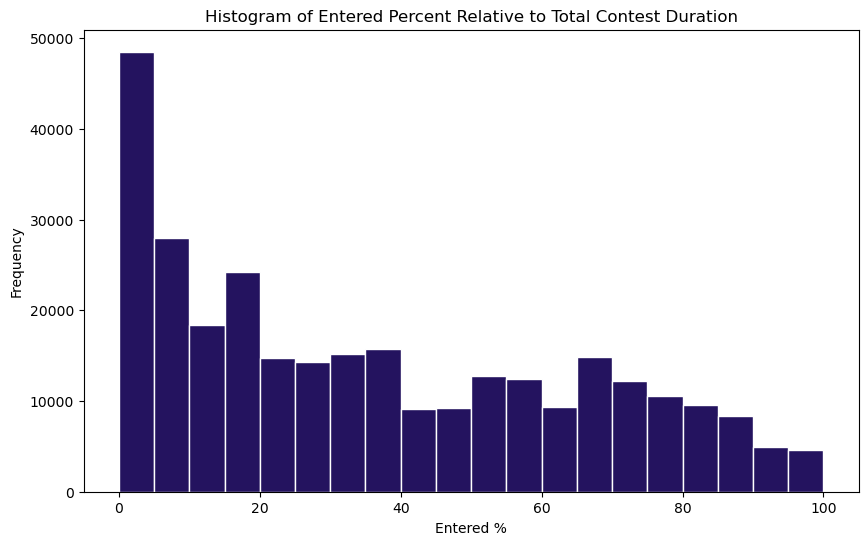

In [41]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
plt.hist(abs(df['entered_percent'].dropna()), bins=20, edgecolor='white', color = '#24135F', range=(0, 100))
plt.title('Histogram of Entered Percent Relative to Total Contest Duration')
plt.xlabel('Entered %')
plt.ylabel('Frequency')
plt.grid(False)
plt.show()

In [43]:
##redoing the contests by month/week to include all

df['starttime_iso'] = pd.to_datetime(df['starttime_iso'])

# Convert emails to lowercase
df['email'] = df['email'].str.lower()

# Group by month-year of contest start time and count unique entrants
all_unique_entrants_per_month = df.groupby(df['starttime_iso'].dt.to_period('M'))['email'].nunique()

print(all_unique_entrants_per_month)

starttime_iso
2024-02     1916
2024-03     7997
2024-04     5401
2024-05     7261
2024-06    11902
2024-07    11176
2024-08     7048
2024-09    16389
2024-10     7919
2024-11     6317
2024-12     2280
2025-01     9050
Freq: M, Name: email, dtype: int64


In [45]:
##redoing the contests by month/week to include all

df['starttime_iso'] = pd.to_datetime(df['starttime_iso'])

# Convert emails to lowercase
df['email'] = df['email'].str.lower()

# Group by month-year of contest start time and count entrants
all_entrants_per_month = df.groupby(df['starttime_iso'].dt.to_period('M'))['email']

print(all_entrants_per_month)

In [193]:
df['starttime_iso'] = pd.to_datetime(df['starttime_iso'], format='mixed').dt.to_period('M')

In [195]:
df['email'] = df['email'].str.lower()

In [47]:
df['starttime_iso'].dt.to_period('M')

0         2025-01
1         2024-06
2         2024-05
3         2024-05
4         2024-03
5         2024-09
6         2024-11
7         2024-09
8         2024-11
9         2024-06
10        2024-09
11        2024-03
12        2024-06
13        2024-09
14        2024-06
15        2024-03
16        2024-09
17        2024-05
18        2024-06
19        2024-08
20        2024-10
21        2025-01
22        2024-07
23        2024-10
24        2024-06
25        2024-03
26        2025-01
27        2024-08
28        2024-08
29        2024-04
30        2024-06
31        2024-11
32        2025-01
33        2024-09
34        2024-09
35        2024-11
36        2024-03
37        2024-11
38        2024-10
39        2024-07
40        2024-10
41        2024-06
42        2024-10
43        2024-10
44        2024-05
45        2024-10
46        2024-08
47        2024-07
48        2024-07
49        2024-09
50        2024-09
51        2024-09
52        2024-03
53        2024-06
54        2024-08
55        

In [147]:
df.groupby(df['starttime_iso'].dt.month).nunique()['email']

starttime_iso
1      9050
2      1916
3      7997
4      5401
5      7261
6     11902
7     11176
8      7048
9     16389
10     7919
11     6317
12     2280
Name: email, dtype: int64

In [149]:
month_dat = pd.DataFrame({'email': df.groupby(df['starttime_iso'].dt.month).nunique()['email'], 
                         'contests': df.groupby(df['starttime_iso'].dt.month).nunique()['title']})
month_dat['ent_per_cont'] = round(month_dat['email']/month_dat['contests'], 2)
month_dat['in_season'] = [1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1]
month_dat

,email,contests,ent_per_cont,in_season
starttime_iso,,,,
1,9050,6,1508.33,1
2,1916,1,1916.00,1
3,7997,1,7997.00,0
4,5401,6,900.17,0
5,7261,1,7261.00,0
6,11902,4,2975.50,0
7,11176,7,1596.57,0
8,7048,5,1409.60,1
9,16389,10,1638.90,1


In [151]:
month_dat.groupby('in_season').mean()

,email,contests,ent_per_cont
in_season,,,
0,8747.400000,3.8,4146.048000
1,7274.142857,6.0,1260.162857


In [400]:
df[df['helix_source'] == 'wit'].groupby(df['starttime_iso'].dt.month).nunique()['email']

starttime_iso
1     3624
2      433
3     2261
4     2568
5     3364
6      550
7      938
8      368
9     3853
10    4180
11     844
12     745
Name: email, dtype: int64

##Female entrants

In [195]:
df2 = df.dropna(subset=['gender_prsn'])

In [197]:
print(df2.head())

                                  id                    title   starttime_iso  \
2   059d6612b7a95e3b31c05852566d38a0  Purple Ticket to Health  9/6/2022 13:00   
4   2e3142ae153a1ea3b8c7a6504daad286  Purple Ticket to Health  9/6/2022 13:00   
7   20dc49eea0077056da5db89e8c581245  Purple Ticket to Health  9/6/2022 13:00   
8   d119e98bf73d963b9787e40f3fa6a7f9  Purple Ticket to Health  9/6/2022 13:00   
23  5c4816c955fd7229911964ac65c6451c  Purple Ticket to Health  9/6/2022 13:00   

       endtime_iso      type                     email firstname   lastname  \
2   1/28/2023 4:59  giveaway         1961kmc@gmail.com     Karen   Chestnut   
4   1/28/2023 4:59  giveaway         1clrags@gmail.com   Crista   Ragsdale    
7   1/28/2023 4:59  giveaway     20mmlopez01@gmail.com    Miguel      Lopez   
8   1/28/2023 4:59  giveaway  2babygirls0512@gmail.com       Kim       Reed   
23  1/28/2023 4:59  giveaway       aren31710@gmail.com     ADREN   KORNEGAY   

    zip              enteredat_iso  ..

In [199]:
df2[df2['gender_prsn'] == 2].groupby(df2['title']).nunique()['email']

title
2012 World Champions Prize Wheel                         1771
2023 25 Days of Giveaways Miller Lite                     480
2023 Arizona Flock Party                                   27
2023 Beach Bash Sweepstakes                                26
2023 Fan Flyaway Contest                                  941
2023 Kickoff Week of Winning                              691
2023 MedStar Health Jersey Swap Sweepstakes               375
2023 NFL Flag Regional Tournament Sweepstakes               1
2023 Pancakes with Pat                                    800
2023 Play Like A Raven Clinic Contest                      47
2023 Playoffs Week of Winning - AFCC                     1517
2023 Playoffs Week of Winning - Divisional               1493
2023 Poe's Pals Sweepstakes                                45
2023 Poe's Pals Sweepstakes - Playoffs                     52
2023 Purple Sweepstakes                                   584
2023 Ravens & Paramount+                                   84
20

In [201]:
df2[df2['gender_prsn'] == 2].groupby(df['title']).nunique()['email']/df2.groupby(df2['title']).nunique()['email']

title
2012 World Champions Prize Wheel                         0.404800
2023 25 Days of Giveaways Miller Lite                    0.576230
2023 7-on-7 Tournament Sweepstakes                            NaN
2023 Arizona Flock Party                                 0.490909
2023 Beach Bash Sweepstakes                              0.577778
2023 Fan Flyaway Contest                                 0.536182
2023 Kickoff Week of Winning                             0.490071
2023 MedStar Health Jersey Swap Sweepstakes              0.623960
2023 NFL Flag Regional Tournament Sweepstakes            0.333333
2023 Pancakes with Pat                                   0.540541
2023 Play Like A Raven Clinic Contest                    0.505376
2023 Playoffs Week of Winning - AFCC                     0.554662
2023 Playoffs Week of Winning - Divisional               0.534551
2023 Poe's Pals Sweepstakes                              0.542169
2023 Poe's Pals Sweepstakes - Playoffs                   0.611765
2023

In [207]:
output = df2[df2['gender_prsn'] == 2].groupby(df2['title']).nunique()['email'] / df2.groupby(df2['title']).nunique()['email']

# Convert the output to a DataFrame to save it to a CSV
output_df = output.reset_index()
output_df.columns = ['contest', 'women %']

directory = '/Users/TimmD/Downloads'
file_path = os.path.join(directory, 'women.csv')

# Create the directory if it doesn't exist
if not os.path.exists(directory):
    os.makedirs(directory)

output_df.to_csv(file_path, index=False, header=True)

print(f"CSV file saved at {file_path}")

CSV file saved at /Users/TimmD/Downloads\women.csv
